# Math Final Grades regression methods

**Task:** <br>

Build a regression model for the variable G3 (final grade) without using the variables G1 and G2. Interpret the model and assess its predictive performance.
<br><br>


Data Set Information:

This data approach student achievement in secondary education of two schools. The data attributes include student grades, demographic, social and school related features) and it was collected by using school reports and questionnaires. 

The dataset is provided regarding the performance in Mathematics (mat) .

Important note: the target attribute G3 has a strong correlation with attributes G2 and G1. This occurs because G3 is the final year grade (issued at the 3rd period), while G1 and G2 correspond to the 1st and 2nd period grades. It is more difficult to predict G3 without G2 and G1, but such prediction is much more useful (see paper source for more details).

## Attribute Information:

1 school - student's school (binary: 'GP' - Gabriel Pereira or 'MS' - Mousinho da Silveira)

2 sex - student's sex (binary: 'F' - female or 'M' - male)

3 age - student's age (numeric: from 15 to 22)

4 address - student's home address type (binary: 'U' - urban or 'R' - rural)

5 famsize - family size (binary: 'LE3' - less or equal to 3 or 'GT3' - greater than 3)

6 Pstatus - parent's cohabitation status (binary: 'T' - living together or 'A' - apart)

7 Medu - mother's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 -“ secondary education or 4 - higher education)

8 Fedu - father's education (numeric: 0 - none, 1 - primary education (4th grade), 2 - 5th to 9th grade, 3 - secondary education or 4 - higher education)

9 Mjob - mother's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')

10 Fjob - father's job (nominal: 'teacher', 'health' care related, civil 'services' (e.g. administrative or police), 'at_home' or 'other')

11 reason - reason to choose this school (nominal: close to 'home', school 'reputation', 'course' preference or 'other')

12 guardian - student's guardian (nominal: 'mother', 'father' or 'other')

13 traveltime - home to school travel time (numeric: 1 - <15 min., 2 - 15 to 30 min., 3 - 30 min. to 1 hour, or 4 - >1 hour)

14 studytime - weekly study time (numeric: 1 - <2 hours, 2 - 2 to 5 hours, 3 - 5 to 10 hours, or 4 - >10 hours)

15 failures - number of past class failures (numeric: n if 1<=n<3, else 4)

16 schoolsup - extra educational support (binary: yes or no)

17 famsup - family educational support (binary: yes or no)

18 paid - extra paid classes within the course subject (Math or Portuguese) (binary: yes or no)

19 activities - extra-curricular activities (binary: yes or no)

20 nursery - attended nursery school (binary: yes or no)

21 higher - wants to take higher education (binary: yes or no)

22 internet - Internet access at home (binary: yes or no)

23 romantic - with a romantic relationship (binary: yes or no)

24 famrel - quality of family relationships (numeric: from 1 - very bad to 5 - excellent)

25 freetime - free time after school (numeric: from 1 - very low to 5 - very high)

26 goout - going out with friends (numeric: from 1 - very low to 5 - very high)

27 Dalc - workday alcohol consumption (numeric: from 1 - very low to 5 - very high)

28 Walc - weekend alcohol consumption (numeric: from 1 - very low to 5 - very high)

29 health - current health status (numeric: from 1 - very bad to 5 - very good)

30 absences - number of school absences (numeric: from 0 to 93)

31 G1 - first period grade (numeric: from 0 to 20)

31 G2 - second period grade (numeric: from 0 to 20)

32 G3 - final grade (numeric: from 0 to 20, output target)

Source:
Paulo Cortez, University of Minho, Guimaraes, Portugal, http://www3.dsi.uminho.pt/pcortez

## Importing libraries and reading CSV file

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv('student-mat.csv',sep=';')
df.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,4,3,2,1,2,5,4,6,10,10


In [3]:
df = df.drop(['G1','G2'],axis=1)
df.head()

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,...,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,...,no,no,4,3,4,1,1,3,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,...,yes,no,5,3,3,1,1,3,4,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,...,yes,no,4,3,2,2,3,3,10,10
3,GP,F,15,U,GT3,T,4,2,health,services,...,yes,yes,3,2,2,1,1,5,2,15
4,GP,F,16,U,GT3,T,3,3,other,other,...,no,no,4,3,2,1,2,5,4,10


In [4]:
print('Number of rows:', len(df))

Number of rows: 395


## Find NA values

In [5]:
df.isna().sum()
# there are no null values

school        0
sex           0
age           0
address       0
famsize       0
Pstatus       0
Medu          0
Fedu          0
Mjob          0
Fjob          0
reason        0
guardian      0
traveltime    0
studytime     0
failures      0
schoolsup     0
famsup        0
paid          0
activities    0
nursery       0
higher        0
internet      0
romantic      0
famrel        0
freetime      0
goout         0
Dalc          0
Walc          0
health        0
absences      0
G3            0
dtype: int64

## Checking for data type

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 31 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   school      395 non-null    object
 1   sex         395 non-null    object
 2   age         395 non-null    int64 
 3   address     395 non-null    object
 4   famsize     395 non-null    object
 5   Pstatus     395 non-null    object
 6   Medu        395 non-null    int64 
 7   Fedu        395 non-null    int64 
 8   Mjob        395 non-null    object
 9   Fjob        395 non-null    object
 10  reason      395 non-null    object
 11  guardian    395 non-null    object
 12  traveltime  395 non-null    int64 
 13  studytime   395 non-null    int64 
 14  failures    395 non-null    int64 
 15  schoolsup   395 non-null    object
 16  famsup      395 non-null    object
 17  paid        395 non-null    object
 18  activities  395 non-null    object
 19  nursery     395 non-null    object
 20  higher    

In [7]:
for var in ['traveltime','studytime','Medu','Fedu','famrel','freetime','goout','Dalc','Walc','health']:
    df[var] = df[var].astype('category')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 395 entries, 0 to 394
Data columns (total 31 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   school      395 non-null    object  
 1   sex         395 non-null    object  
 2   age         395 non-null    int64   
 3   address     395 non-null    object  
 4   famsize     395 non-null    object  
 5   Pstatus     395 non-null    object  
 6   Medu        395 non-null    category
 7   Fedu        395 non-null    category
 8   Mjob        395 non-null    object  
 9   Fjob        395 non-null    object  
 10  reason      395 non-null    object  
 11  guardian    395 non-null    object  
 12  traveltime  395 non-null    category
 13  studytime   395 non-null    category
 14  failures    395 non-null    int64   
 15  schoolsup   395 non-null    object  
 16  famsup      395 non-null    object  
 17  paid        395 non-null    object  
 18  activities  395 non-null    object  
 19  nursery 

In [8]:
num_col = df._get_numeric_data().columns
cat_col = list(set(df.columns)-set(num_col))
num_col = list(num_col)[0:3]

In [9]:
nominal_col = ['higher','Fjob','address','guardian','school','paid','sex','Mjob','activities','reason','nursery','romantic','internet','Pstatus','famsup','schoolsup','famsize']
ordinal_col = np.setdiff1d(cat_col,nominal_col)

In [10]:
# change ordinal data to integer data format
for col in ordinal_col:
    df[col] = df[col].astype(int)

In [11]:
# checking for erroneous data in categorical data
for col in df[cat_col]:
    print(col,df[co].unique())

famsize ['GT3' 'LE3']
paid ['no' 'yes']
internet ['no' 'yes']
studytime [2 3 1 4]
activities ['no' 'yes']
famrel [4 5 3 1 2]
famsup ['no' 'yes']
sex ['F' 'M']
nursery ['yes' 'no']
Dalc [1 2 5 3 4]
address ['U' 'R']
Mjob ['at_home' 'health' 'other' 'services' 'teacher']
romantic ['no' 'yes']
Pstatus ['A' 'T']
Fjob ['teacher' 'other' 'services' 'health' 'at_home']
guardian ['mother' 'father' 'other']
reason ['course' 'other' 'home' 'reputation']
health [3 5 1 2 4]
school ['GP' 'MS']
higher ['yes' 'no']
schoolsup ['yes' 'no']
Walc [1 3 2 4 5]
Fedu [4 1 2 3 0]
goout [4 3 2 1 5]
freetime [3 2 4 1 5]
Medu [4 1 3 2 0]
traveltime [2 1 3 4]


In [12]:
# checking for erroneous data in numerical data
df[num_col].describe()

,age,failures,absences
count,395.000000,395.000000,395.000000
mean,16.696203,0.334177,5.708861
std,1.276043,0.743651,8.003096
min,15.000000,0.000000,0.000000
25%,16.000000,0.000000,0.000000
50%,17.000000,0.000000,4.000000
75%,18.000000,0.000000,8.000000
max,22.000000,3.000000,75.000000


In [13]:
for i in df[num_col]:
    print(i,df[i].unique())

age [18 17 15 16 19 22 20 21]
failures [0 3 2 1]
absences [ 6  4 10  2  0 16 14  7  8 25 12 54 18 26 20 56 24 28  5 13 15 22  3 21
  1 75 30 19  9 11 38 40 23 17]


In [14]:
# checking for erroneous data in G3
df['G3'].describe()

count    395.000000
mean      10.415190
std        4.581443
min        0.000000
25%        8.000000
50%       11.000000
75%       14.000000
max       20.000000
Name: G3, dtype: float64

In [15]:
df['G3'].unique()

array([ 6, 10, 15, 11, 19,  9, 12, 14, 16,  5,  8, 17, 18, 13, 20,  7,  0,
        4], dtype=int64)

## Exploratory Data Analytics

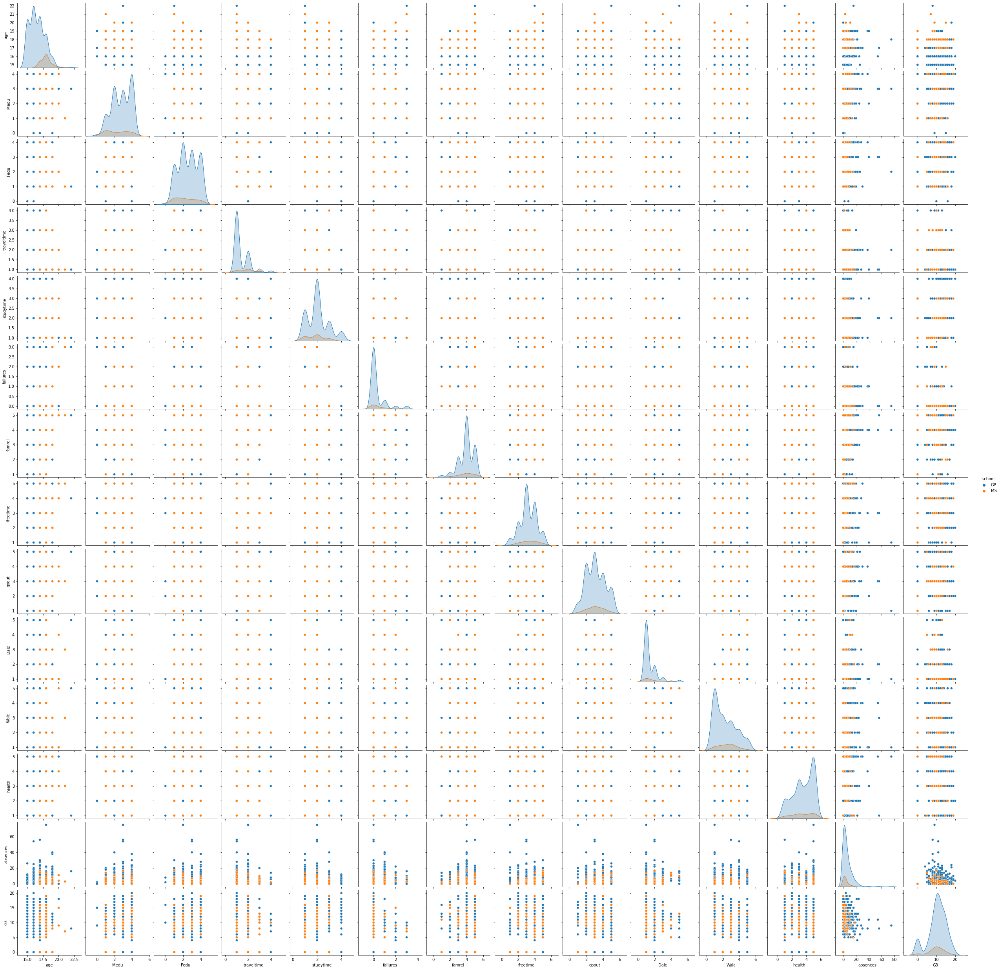

In [16]:
import seaborn as sns
sns.pairplot(df, hue = 'school')

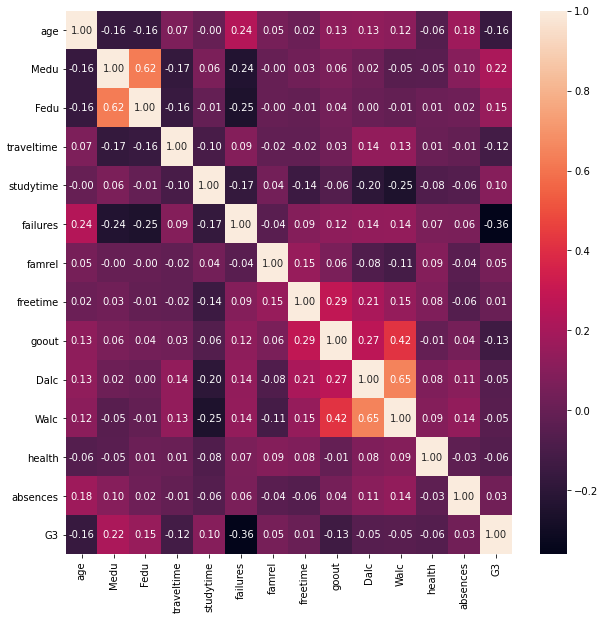

In [17]:
corrs = df.corr()
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(corrs, annot=True, fmt='.2f', ax=ax)
plt.show()

** Observation **
* Fedu and Medu has moderate correlation
* Walc and Dalc has moderate correlation
* Walc and goout has weak correlation

C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 23.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='school', ylabel='age'>

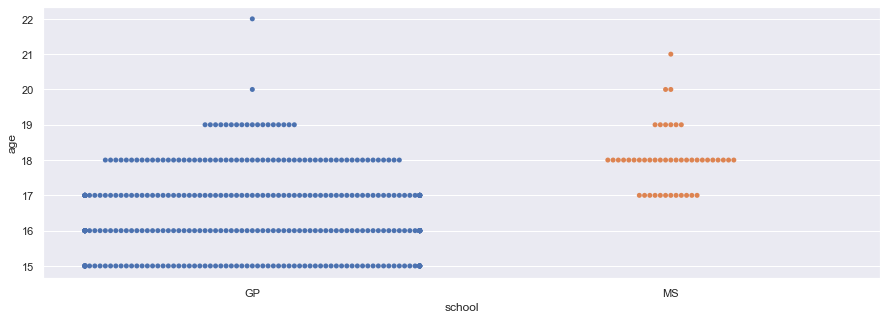

In [18]:
sns.set(rc={'figure.figsize':(15,5)})
sns.swarmplot(data=df, x='school', y='age')

** Observation **
* GP students tend to be younger than MS

(0.0, 35.0)

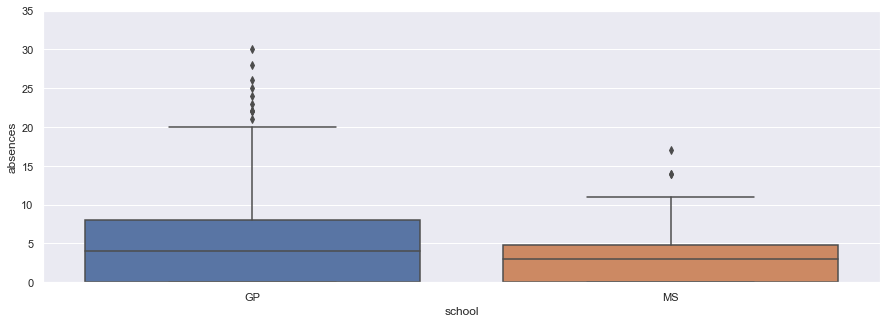

In [19]:
ax = sns.boxplot(data=df, x='school', y='absences')
ax.set_ylim([0, 35])

** Observation **
* Students from MS generally are less absent to classes

In [20]:
df.groupby(by='school').mean()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G3
school,,,,,,,,,,,,,,
GP,16.521490,2.802292,2.553009,1.386819,2.063037,0.318052,3.959885,3.223496,3.111748,1.444126,2.260745,3.575931,5.965616,10.489971
MS,18.021739,2.347826,2.282609,1.913043,1.826087,0.456522,3.826087,3.326087,3.086957,1.760870,2.521739,3.391304,3.760870,9.847826


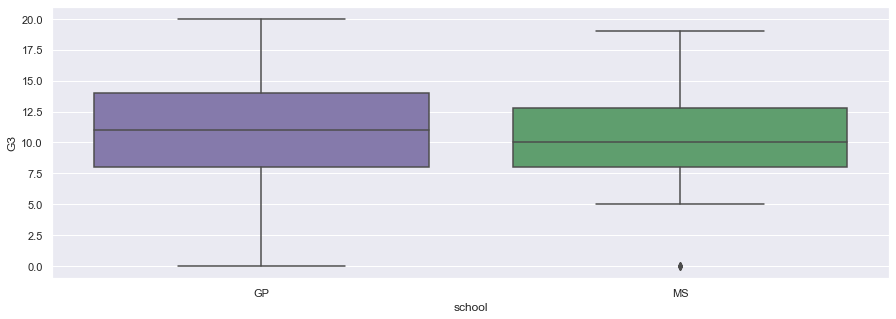

In [21]:
sns.boxplot(x="school", y="G3",
            palette=["m", "g"],
            data=df)
sns.set(rc={'figure.figsize':(8,5)})

** Observation **
* GP median score, 25th and 75th percentile is higher than MS, this shows GP generally does better than MS.

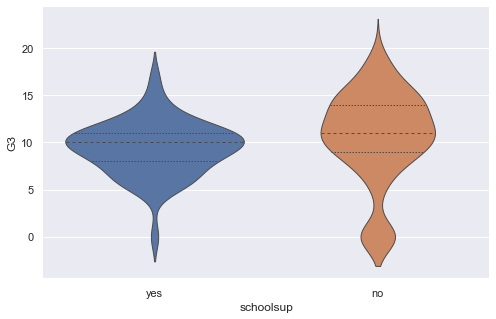

In [22]:
sns.violinplot(data=df[df['school']=='GP'], x="schoolsup", y="G3", 
               split=True, inner="quart", linewidth=1)
sns.despine(left=True)

** Observation **
* GP's students with school support still do worse than students without support. This could be due to the fact that students having decent scores are not required to take additional educational support.

<AxesSubplot:xlabel='Pstatus', ylabel='G3'>

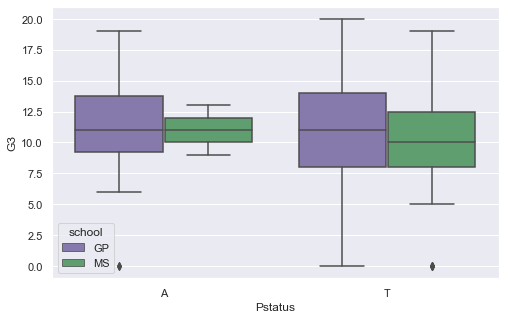

In [23]:
sns.boxplot(x="Pstatus", y="G3", hue ='school',
            palette=["m", "g"],
            data=df)

** Observation **
* Graph above shows that in MS's students with parent living together tend to score worse for their math as compared to all other groups.

<AxesSubplot:xlabel='internet', ylabel='G3'>

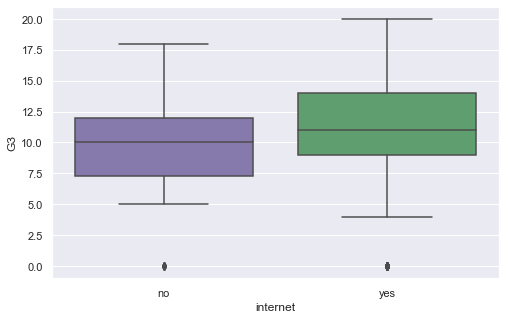

In [24]:
sns.boxplot(x="internet", y="G3",
            palette=["m", "g"],
            data=df)

** Observation **
* The score for students with internet access is significantly higher than students with no internet access. Internet is likely to be beneficial to studying

## Reduce skewness in numerical data

In [25]:
skew_limit = 0.75

skew_cols = (df[num_col].skew()
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'})
             .query('abs(Skew) > {}'.format(skew_limit)))

skew_cols # very high skewness in features

,Skew
absences,3.671579
failures,2.387026


pop_orignial skewness:  3.6715789504758862
pop_log1p skewness:  0.07128935952936238


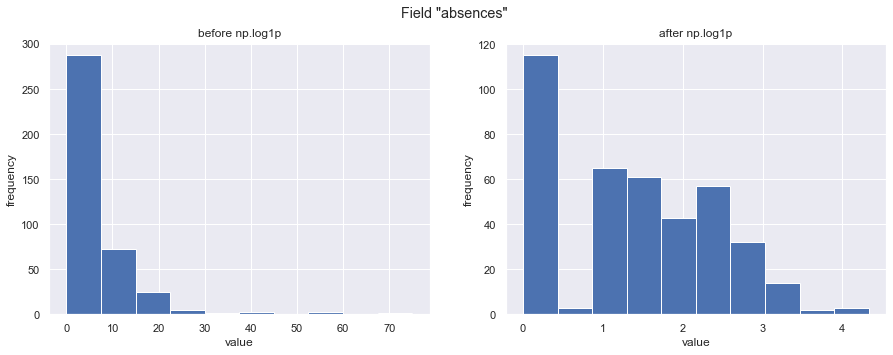

In [26]:
field = "absences"
fig, (ax_original, ax_log1p) = plt.subplots(1, 2, figsize=(15, 5))

df[field].hist(ax=ax_original)

# Apply a log transformation (numpy syntax) to this column
df[field].apply(np.log1p).hist(ax=ax_log1p)

# Formatting of titles etc. for each subplot
ax_original.set(title='before np.log1p', ylabel='frequency', xlabel='value')
ax_log1p.set(title='after np.log1p', ylabel='frequency', xlabel='value')
fig.suptitle('Field "{}"'.format(field));
print('pop_orignial skewness: ',df[field].skew())
print('pop_log1p skewness: ',df[field].apply(np.log1p).skew())
# fall in skewness after log1p

In [27]:
# apply log1p across all numerical columns

for col in df[skew_cols.index]:
# drop famrel as skewness increase after log1p
    df[col] = df[col].apply(np.log1p)
new_skew_cols = (df[skew_cols.index].skew()
             .sort_values(ascending=False)
             .to_frame()
             .rename(columns={0:'Skew'}))

skew_cols['New_skew'] = new_skew_cols
skew_cols['Difference'] = abs(skew_cols['New_skew']) - abs(skew_cols['Skew'])
skew_cols

,Skew,New_skew,Difference
absences,3.671579,0.071289,-3.600290
failures,2.387026,1.855862,-0.531163


Decrease in skewness of each numercal data feature

## MinMax scale numerical data

In [28]:
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
for col in num_col:
    df[col] = mm.fit_transform(df[[col]])

## One hot encoding of categorical data

In [29]:
df = pd.get_dummies(df, columns=nominal_col,drop_first=True)
df.head()
# df is the transformed dataest for ML, df is the orignal dataset

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,...,reason_home,reason_other,reason_reputation,nursery_yes,romantic_yes,internet_yes,Pstatus_T,famsup_yes,schoolsup_yes,famsize_LE3
0,0.428571,4,4,2,2,0.0,4,3,4,1,...,0,0,0,1,0,0,0,0,1,0
1,0.285714,1,1,1,2,0.0,5,3,3,1,...,0,0,0,0,0,1,1,1,0,0
2,0.000000,1,1,1,2,1.0,4,3,2,2,...,0,1,0,1,0,1,1,0,1,1
3,0.000000,4,2,1,3,0.0,3,2,2,1,...,1,0,0,1,1,1,1,1,0,0
4,0.142857,3,3,1,2,0.0,4,3,2,1,...,1,0,0,1,0,0,1,1,0,0


First value of each categorical data is dropped to ensure no multicollinearity

## Polynomial Features
For models that have an overall low training time, we will introduce a 2nd degree polynomial function and interaction feature to our existing features. This will allow the linear regression to identify 2nd degree polynomial and ineratcting varaible trends.

y = β₁a + β₂b → y = β₁a + β₂b + β₃a² +β₄b² + β₅ab

In [30]:
from sklearn.preprocessing import PolynomialFeatures

In [31]:
feature_cols = list(filter(lambda x: x!= 'G3', df.columns))

pf = PolynomialFeatures(degree=2, include_bias=False,)
X_pf = pf.fit_transform(df[feature_cols])

## Train Test Split

In [32]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df, 
                                     train_size = 0.7, 
                                     test_size = 0.3, 
                                     random_state = 42)

feature_cols = list(filter(lambda x: x!= 'G3', df.columns))

X_train = df_train[feature_cols]
y_train = df_train['G3']

X_test = df_test[feature_cols]
y_test = df_test['G3']

In [33]:
# splitting of Polynomial feautures
X_pf_train = X_pf[X_train.index]
y_pf_train = df['G3'][X_train.index]

X_pf_test = X_pf[X_test.index]
y_pf_test = df['G3'][X_test.index]

## Model Kfold and evaluation

In [34]:
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.pipeline import Pipeline
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV
from timeit import default_timer as timer # Calcuate time elapsed in training model

# define root mean sq error func
def rmse(ytrue, ypredicted):
    return np.sqrt(mean_squared_error(ytrue, ypredicted))

folds = KFold(n_splits = 5, shuffle = True, random_state = 100)

In [91]:
import statsmodels.api as sm
def diagnostic_plot(y_test, prediction):
    residual = y_test - prediction
    
    fig, axs = plt.subplots(2, 2,figsize=(15,10))
    fig.suptitle('Diagnostic plots')
    axs[0,0].plot([0, 15], [0, 20], ls="--", c="red", alpha=0.5)
    axs[0,0].scatter(y_test, prediction)
    axs[0,0].set_title('Truth-Prediction plot')
    axs[0,0].set_xlabel("Truth")
    axs[0,0].set_ylabel("Predictions")
    
    sm.qqplot(residual,fit=True,line= 's', ax=axs[0,1])
    axs[0,1].set_title('QQ plot')
    axs[0,1].set_xlabel("Theoretical Quantiles")
    axs[0,1].set_ylabel("Sample Quantiles")
    
    sns.residplot(prediction,y_test,
                              lowess=True,
                              scatter_kws={'alpha': 0.5},
                              line_kws={'color': 'red', 'lw': 1, 'alpha': 0.8},
                              ax=axs[1,0])
    axs[1,0].set_title('Residual plot')
    axs[1,0].set_xlabel("Predicted")
    axs[1,0].set_ylabel("Residual")
    
    sqrt_standardized_residual=np.sqrt(np.abs(residual))
    sns.regplot(prediction, sqrt_standardized_residual,
                  scatter=True,
                  lowess=True,
                  line_kws={'color': 'red', 'lw': 1, 'alpha': 0.5},
                  ax=axs[1,1])
    axs[1,1].set_title('Scale-Location plot')
    axs[1,1].set_xlabel("Predicted")
    axs[1,1].set_ylabel("Sqrt Standarized residuals")

GridSearchCV is used to optimize the model through hyperparameter tuning. This allows hyperparameters to be tuned through searching exhaustively through a specified subset of hyperparameters.

## Dummy Model
As the basis of evaluation, a dummy model will be used to determine if a model can outperform the average; all predicted values are average G3 values.

In [36]:
average_G3 = np.mean(y_test)
average_G3

10.319327731092438

In [37]:
start = timer()

dummy_prediction =[]
for row in range(len(y_test)):
    dummy_prediction.append(average_G3)

print("R2 score: ",r2_score(y_test, dummy_prediction))
print('RMSE: ', rmse(y_test,dummy_prediction))

end = timer()
dummy_time = end - start
print('Time Elapsed (sec):', dummy_time)

R2 score:  0.0
RMSE:  4.68850332340724
Time Elapsed (sec): 0.002764700000625453


As expected, the R2 scores = 0 as the dummy model is not able to explain the dependent variable.

## Regression models
* Linear regression
* Regularized linear regression (Lasso, Ridge and Elastic Net)
* Stepwise regression (Forward and Backwards)
* Random Forest Regressor

## Base Linear Regression

Ordinary Least Squares method is used in the linear regression to estimate the above parameters, where the model minimizes the sum of squared residuals (difference between predicted G3 and actual G3).

In [38]:
from sklearn.linear_model import LinearRegression

lm = LinearRegression()
lm_cv = GridSearchCV(estimator = lm, 
                        param_grid = {},
                        cv = folds)      
start = timer()
# fit the model
lm_cv.fit(X_train, y_train)   

end = timer()
lm_time = end - start
print('Time Elapsed (sec):', lm_time)

Time Elapsed (sec): 0.0817243999999846


In [39]:
lm_prediction = lm_cv.predict(X_test)

print("R2 score: ",r2_score(y_test, lm_prediction))
print('RMSE: ', rmse(y_test,lm_prediction))

R2 score:  0.2233681002200466
RMSE:  4.131824254489553


C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


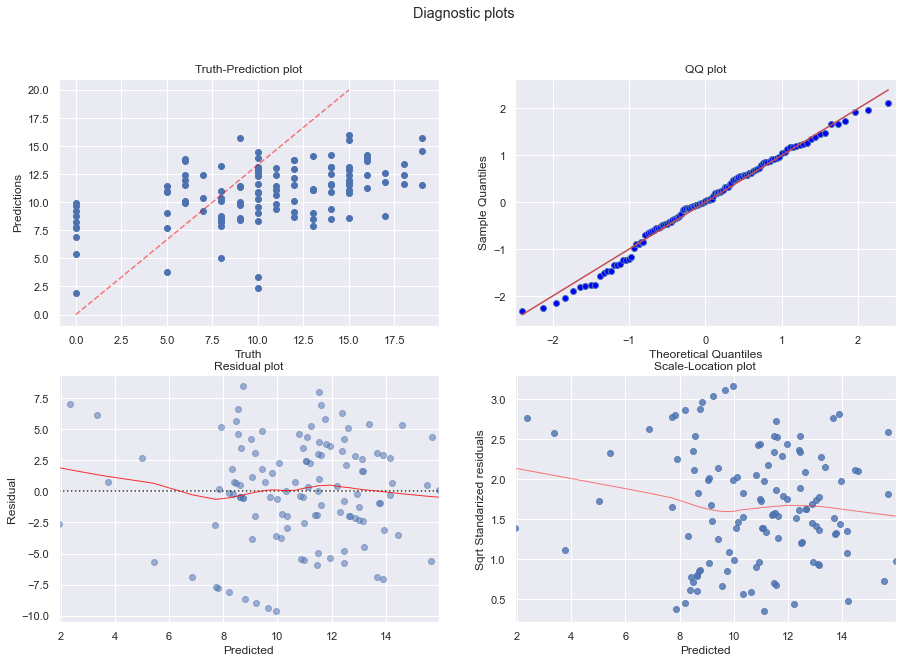

In [92]:
diagnostic_plot(y_test, lm_prediction)

In [83]:
print("\u0332".join('Feature_coefficient (Top)'),'\n')
features = []
coeffs = []
coeffs_abs = []
for feature, coeff in zip(X_test.columns, lm_cv.best_estimator_.coef_):
    features.append(feature)
    coeffs.append(coeff)
    coeffs_abs.append(abs(coeff))

pd.DataFrame({'Features': features, 'Coefficients': coeffs ,'abs_coeffs':coeffs_abs}).sort_values('abs_coeffs', ascending = False).iloc[0:6,0:2]

F̲e̲a̲t̲u̲r̲e̲_̲c̲o̲e̲f̲f̲i̲c̲i̲e̲n̲t̲ ̲(̲T̲o̲p̲) 



,Features,Coefficients
5,failures,-4.799426
12,absences,4.582275
0,age,-2.625281
13,higher_yes,1.920575
24,Mjob_health,1.578328
21,school_MS,1.459841


In [84]:
print("\u0332".join('Feature_coefficient (Bottom)'),'\n')
pd.DataFrame({'Features': features, 'Coefficients': coeffs ,'abs_coeffs':coeffs_abs}).sort_values('abs_coeffs', ascending = True).iloc[0:6,0:2]

F̲e̲a̲t̲u̲r̲e̲_̲c̲o̲e̲f̲f̲i̲c̲i̲e̲n̲t̲ ̲(̲B̲o̲t̲t̲o̲m̲) 



,Features,Coefficients
11,health,-0.060932
16,Fjob_services,-0.072775
14,Fjob_health,-0.092480
25,Mjob_other,0.127936
10,Walc,0.138847
7,freetime,0.200853


**What features affects grades the most?**

As seen on the tables, the top 3 features (failure, absences, age) have the highest absolute coefficient while the bottom 2 (health, Fjob_services) has the lowest absolute coefficient value.
Failure and age are negatively related to the final grade; younger students with lower past failures tend to attain higher grades.


## Linear Regression using polynomial features

As the linear regression training time is low, we will introduce 2nd degree polynomial features and interacting features to train the model.

In [43]:
lm = LinearRegression()
lm_pf_cv = GridSearchCV(estimator = lm, 
                        param_grid = {},
                        cv = folds)      
start = timer()
# fit the model
lm_pf_cv.fit(X_pf_train, y_pf_train)   

end = timer()
lm_pf_time = end - start
print('Time Elapsed (sec):', lm_pf_time)

Time Elapsed (sec): 0.8989854999999807


In [44]:
lm_pf_prediction = lm_pf_cv.predict(X_pf_test)

print("R2 score: ",r2_score(y_pf_test, lm_pf_prediction))
print('RMSE: ', rmse(y_pf_test,lm_pf_prediction))

R2 score:  -1.0737920756032593
RMSE:  6.751757468432462


From the R2 score and RMSE, the model is worse off than the dummy model and performed worse than a horizontal linear equation (negative R2 score). This model will be rejected as human intuition will be a better predictor than the model.

C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


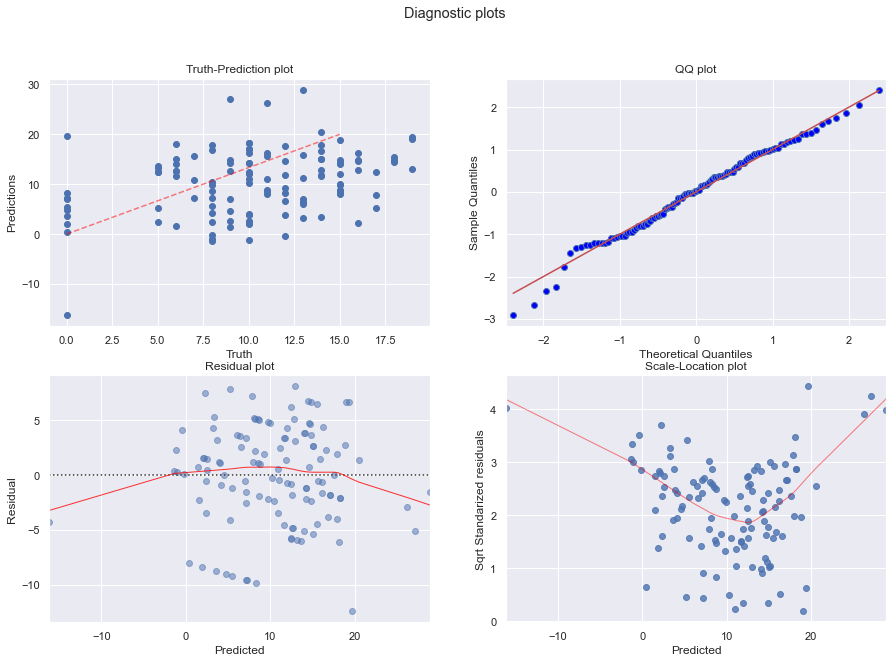

In [93]:
diagnostic_plot(y_test, lm_pf_prediction)

Concerning as there are negative predicted values, grades cannot be negative! Scale-location plot shows that predicted values in the extreme ends are not well predicted and has high residual (difference from actual)

## Lasso Regression
$cost(W) = ... + λ|w|$

The lasso regression has the unique property to assign certain coefficients to 0, reducing the features that have little to no influence on the model and increasing interpretability.

In [46]:
alphas = np.geomspace(0.001, 10, 30)

In [47]:
from sklearn.linear_model import LassoCV

start = timer()
lasso_estimator = LassoCV(alphas=alphas,
                            cv=5).fit(X_train,y_train)
lasso_prediction = lasso_estimator.predict(X_test)

print('Alpha param: ', lasso_estimator.alpha_)
print("R2 score: ",r2_score(y_test, lasso_prediction))
print('RMSE: ', rmse(y_test,lasso_prediction))

end = timer()
lasso_time = end - start
print('Time Elapsed (sec):', lasso_time)

Alpha param:  0.11721022975334805
R2 score:  0.17953735632718226
RMSE:  4.2468178512512615
Time Elapsed (sec): 0.07319170000027952


In [48]:
print("Number of non-zero coeff: ", sum(lasso_estimator.coef_ != 0))
print("Mean coeff: ",sum(abs(lasso_estimator.coef_))/sum(lasso_estimator.coef_ != 0))

Number of non-zero coeff:  16
Mean coeff:  0.5875635264556797


As compared to the ridge regression, coefficients of some features will be assigned as 0. This reduces the number of acitve features in Lasso regression.

In [82]:
print("\u0332".join('Feature_coefficient (Top)'),'\n')
features = []
coeffs = []
coeffs_abs = []
for feature, coeff in zip(X_test.columns, lasso_estimator.coef_):
    features.append(feature)
    coeffs.append(coeff)
    coeffs_abs.append(abs(coeff))

pd.DataFrame({'Features': features, 'Coefficients': coeffs ,'abs_coeffs':coeffs_abs}).sort_values('abs_coeffs', ascending = False).iloc[0:6,0:2]

F̲e̲a̲t̲u̲r̲e̲_̲c̲o̲e̲f̲f̲i̲c̲i̲e̲n̲t 



,Features,Coefficients
5,failures,-3.676731
12,absences,2.079789
33,romantic_yes,-0.585059
36,famsup_yes,-0.507942
22,paid_yes,0.468462
1,Medu,0.430562


C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


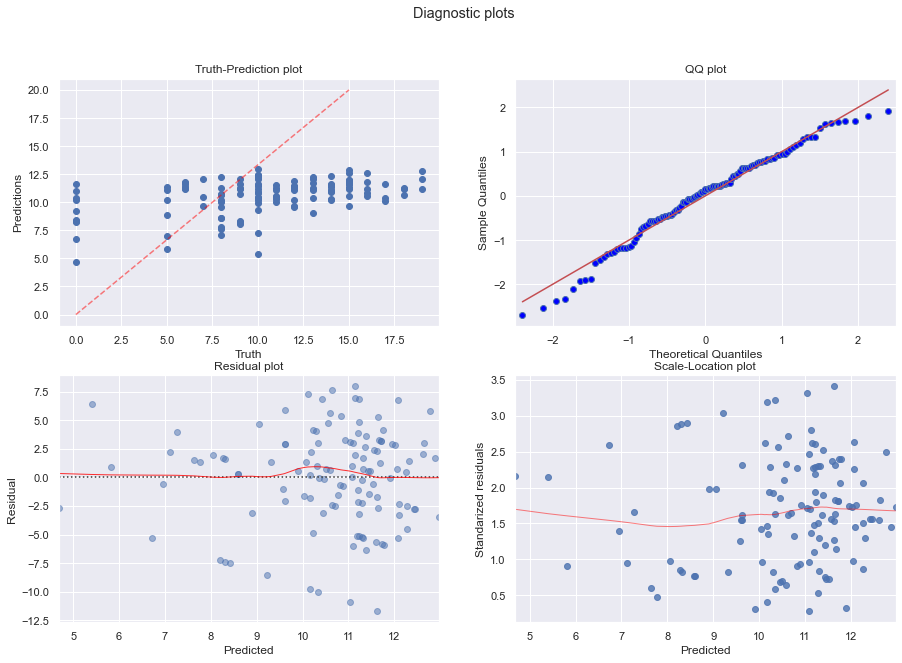

In [50]:
diagnostic_plot(y_test, lasso_prediction)

## Ridge Regression
$cost(W) = ... + λ(w)^2$

In [51]:
alphas = np.geomspace(1, 100, 30)

In [52]:
from sklearn.linear_model import RidgeCV

start = timer()
ridge_estimator = RidgeCV(alphas=alphas,
                            cv=5).fit(X_train,y_train)
ridge_prediction = ridge_estimator.predict(X_test)

print('Alpha param: ', ridge_estimator.alpha_)
print("R2 score: ",r2_score(y_test, ridge_prediction))
print('RMSE: ', rmse(y_test,ridge_prediction))

end = timer()
ridge_time = end - start
print('Time Elapsed (sec):', ridge_time)

Alpha param:  20.433597178569418
R2 score:  0.22100192375727934
RMSE:  4.138113714126336
Time Elapsed (sec): 1.933675299999777


In [53]:
print("Number of non-zero coeff: ", sum(ridge_estimator.coef_ != 0))
print("Mean coeff: ",sum(abs(ridge_estimator.coef_))/sum(ridge_estimator.coef_ != 0))

Number of non-zero coeff:  39
Mean coeff:  0.4722767456927424


In [85]:
print("\u0332".join('Feature_coefficient (Top)'),'\n')
features = []
coeffs = []
coeffs_abs = []
for feature, coeff in zip(X_test.columns, ridge_estimator.coef_):
    features.append(feature)
    coeffs.append(coeff)
    coeffs_abs.append(abs(coeff))

pd.DataFrame({'Features': features, 'Coefficients': coeffs ,'abs_coeffs':coeffs_abs}).sort_values('abs_coeffs', ascending = False).iloc[0:6,0:2]

F̲e̲a̲t̲u̲r̲e̲_̲c̲o̲e̲f̲f̲i̲c̲i̲e̲n̲t̲ ̲(̲T̲o̲p̲) 



,Features,Coefficients
5,failures,-2.384346
12,absences,1.810674
13,higher_yes,1.146215
33,romantic_yes,-0.879308
22,paid_yes,0.766220
36,famsup_yes,-0.761135


Absences has the highest coefficient and influence in the ridge regression model

C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


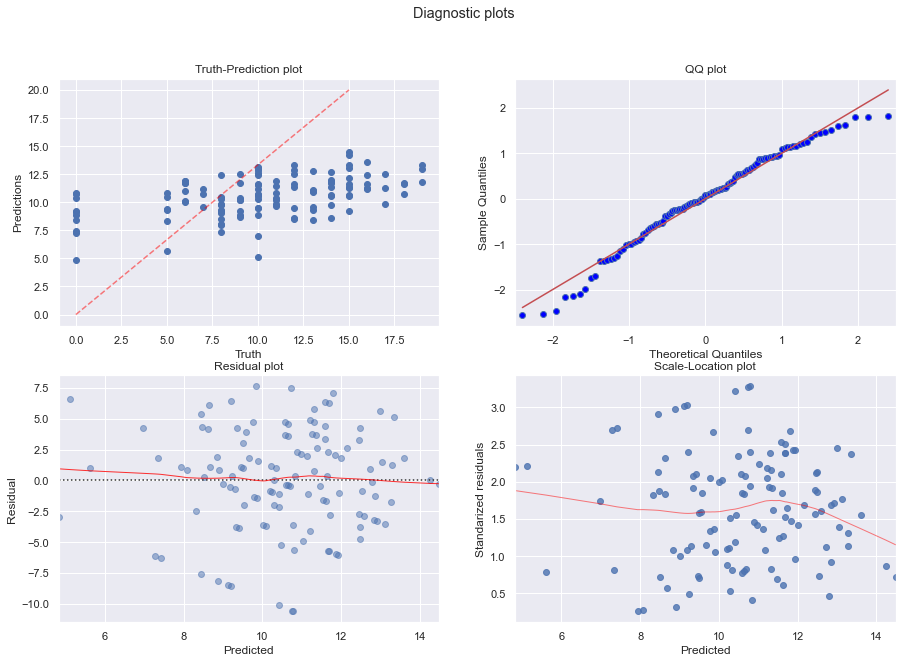

In [55]:
diagnostic_plot(y_test, ridge_prediction)

## Elasticnet Regression
Combination of Lasso and Ridge regression

In [56]:
from sklearn.linear_model import ElasticNetCV
alphas = np.geomspace(0.01, 1, 30)
l1_ratios = np.linspace(0.1, 0.9, 9)

start = timer()
elasticNetCV = ElasticNetCV(alphas=alphas, 
                            l1_ratio=l1_ratios,
                            cv=5).fit(X_train,y_train)
elasticNet_prediction = elasticNetCV.predict(X_test)

print('Alpha param: ', elasticNetCV.alpha_)
print('l1 ratio param: ', elasticNetCV.l1_ratio_)
print("R2 score: ",r2_score(y_test, elasticNet_prediction))
print('RMSE: ', rmse(y_test,elasticNet_prediction))

end = timer()
EN_time = end - start
print('Time Elapsed (sec):', EN_time)

Alpha param:  0.10826367338740546
l1 ratio param:  0.9
R2 score:  0.17982405996292317
RMSE:  4.246075779376131
Time Elapsed (sec): 0.5025100000002567


In [57]:
print("Number of non-zero coeff: ", sum(elasticNetCV.coef_ != 0))
print("Mean coeff: ",sum(abs(elasticNetCV.coef_))/sum(elasticNetCV.coef_ != 0))

Number of non-zero coeff:  16
Mean coeff:  0.629476038994502


In [89]:
print("\u0332".join('Feature_coefficient (Top)'),'\n')
features = []
coeffs = []
coeffs_abs = []
for feature, coeff in zip(X_test.columns, elasticNetCV.coef_):
    features.append(feature)
    coeffs.append(coeff)
    coeffs_abs.append(abs(coeff))

pd.DataFrame({'Features': features, 'Coefficients': coeffs ,'abs_coeffs':coeffs_abs}).sort_values('abs_coeffs', ascending = False).iloc[0:6,0:2]

F̲e̲a̲t̲u̲r̲e̲_̲c̲o̲e̲f̲f̲i̲c̲i̲e̲n̲t̲ ̲(̲T̲o̲p̲) 



,Features,Coefficients
5,failures,-3.320843
12,absences,2.054358
33,romantic_yes,-0.633847
36,famsup_yes,-0.605893
13,higher_yes,0.578596
22,paid_yes,0.550068


C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


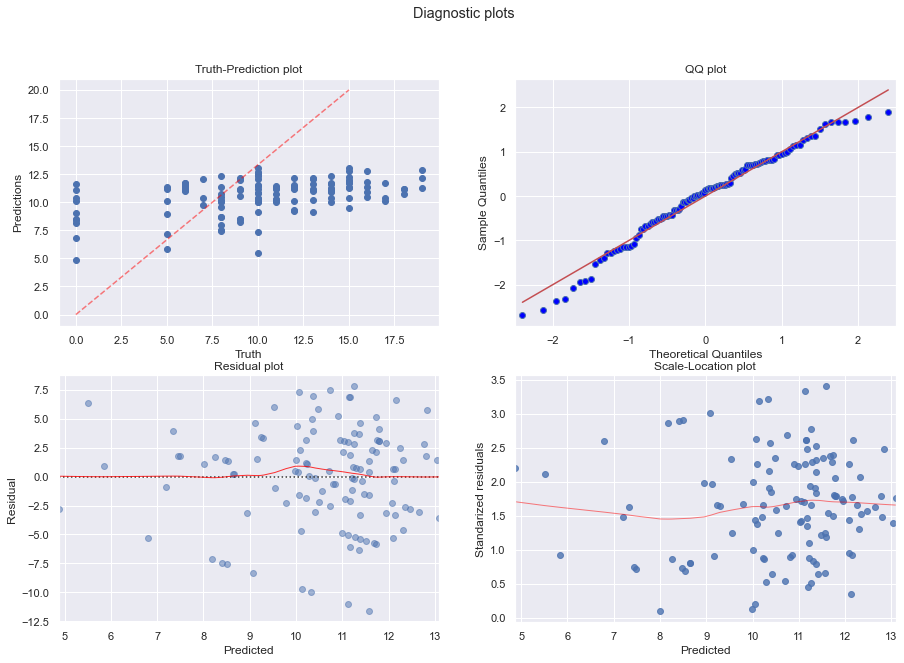

In [59]:
diagnostic_plot(y_test, elasticNet_prediction)

## Stepwise regression - Forward

Due to the large number of features, the stepwise feature selection can be used to select a subset of features based on a forward and a backward selection.

In [60]:
# Starting with no features, features are added in iteratively based on the p-value
def forward_regression(X, y,
                       threshold_in,
                       verbose=False):
    initial_list = []
    included = list(initial_list)
    while True:
        changed=False
        excluded = list(set(X.columns)-set(included))
        new_pval = pd.Series(index=excluded)
        for new_column in excluded:
            model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included+[new_column]]))).fit()
            new_pval[new_column] = model.pvalues[new_column]
        best_pval = new_pval.min()
        if best_pval < threshold_in:
            best_feature = new_pval.idxmin()
            included.append(best_feature)
            changed=True
            if verbose:
                print('Add  {:17} with p-value {:.6}'.format(best_feature, best_pval))

        if not changed:
            break

    return included

# Starting with all features, features are removed iteratively based on the p-value
def backward_regression(X, y,
                           threshold_out,
                           verbose=False):
    included=list(X.columns)
    while True:
        changed=False
        model = sm.OLS(y, sm.add_constant(pd.DataFrame(X[included]))).fit()
        # use all coefs except intercept
        pvalues = model.pvalues.iloc[1:]
        worst_pval = pvalues.max() # null if pvalues is empty
        if worst_pval > threshold_out:
            changed=True
            worst_feature = pvalues.idxmax()
            included.remove(worst_feature)
            if verbose:
                print('Drop {:17} with p-value {:.6}'.format(worst_feature, worst_pval))
        if not changed:
            break
    return included

In [61]:
start = timer()
forward_regression_features = forward_regression(X_train,y_train, threshold_in=0.05, verbose = True)
forward_regression_features

ipykernel_launcher:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Add  failures          with p-value 1.09944e-10
ipykernel_launcher:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Add  absences          with p-value 6.01607e-05
ipykernel_launcher:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Add  Mjob_health       with p-value 0.0243423
ipykernel_launcher:10: DeprecationWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
Add  goout             with p-value 0.0279877
ipykernel_launcher:10: DeprecationWarning: The default d

['failures', 'absences', 'Mjob_health', 'goout', 'higher_yes', 'sex_M']

In [62]:
lm = LinearRegression()
lm_forward = GridSearchCV(estimator = lm, 
                        param_grid = {},
                        cv = folds)      

# fit the model
lm_forward.fit(X_train[forward_regression_features], y_train)

end = timer()
lm_forward_time = end - start
print('Time Elapsed (sec):', lm_forward_time)   

Time Elapsed (sec): 2.283263799999986


In [63]:
lm_forward_prediction = lm_forward.predict(X_test[forward_regression_features])

print("R2 score: ",r2_score(y_test, lm_forward_prediction))
print('RMSE: ', rmse(y_test,lm_forward_prediction))

R2 score:  0.16049935396964987
RMSE:  4.295806843515889


C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


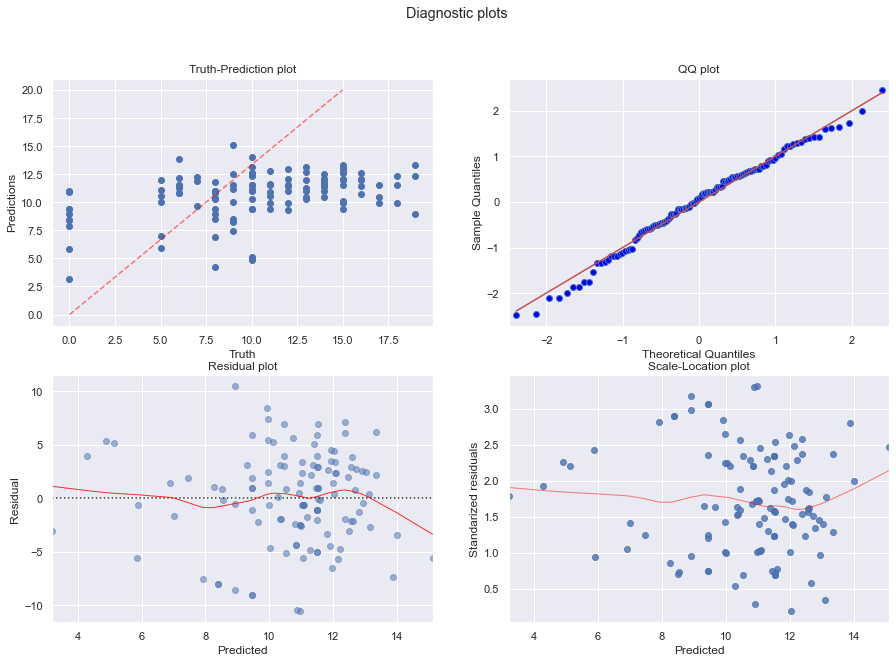

In [64]:
diagnostic_plot(y_test, lm_forward_prediction)

## Stepwise regression - Backward

In [65]:
start = timer()
backward_regression_features = backward_regression(X_train,y_train, threshold_out=0.5,verbose = True)

Drop Fjob_health       with p-value 0.953278
Drop Fjob_services     with p-value 0.971905
Drop Mjob_other        with p-value 0.881476
Drop reason_other      with p-value 0.764988
Drop health            with p-value 0.734486
Drop Walc              with p-value 0.639544
Drop nursery_yes       with p-value 0.582757
Drop address_U         with p-value 0.594751
Drop guardian_mother   with p-value 0.634697
Drop activities_yes    with p-value 0.518019
Drop Mjob_services     with p-value 0.536447
Drop reason_reputation with p-value 0.529065


In [66]:
lm = LinearRegression()
lm_backward = GridSearchCV(estimator = lm, 
                        param_grid = {},
                        cv = folds)      

# fit the model
lm_backward.fit(X_train[backward_regression_features], y_train)

end = timer()
lm_backward_time = end - start
print('Time Elapsed (sec):', lm_backward_time)  

Time Elapsed (sec): 0.5267610999999306


In [67]:
lm_backwards_prediction = lm_backward.predict(X_test[backward_regression_features])

print("R2 score: ",r2_score(y_test, lm_backwards_prediction))
print('RMSE: ', rmse(y_test,lm_backwards_prediction))

R2 score:  0.2003245485099362
RMSE:  4.192674144857239


C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


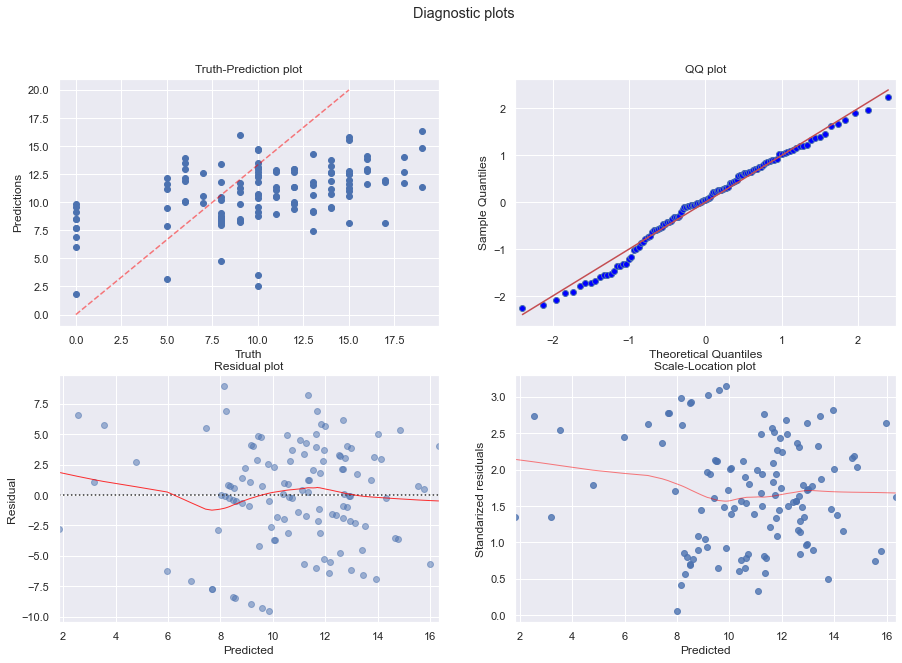

In [68]:
diagnostic_plot(y_test, lm_backwards_prediction)

## Random Forest Regressor

The Random Forest regressor is generated through an ensemble of individual decision trees. Each decision tree will be trained on a random subset of features, such that the ensemble model includes bias that prevents overfitting. This ultimately reduces the variance in the test data.

In [69]:
from sklearn.ensemble import RandomForestRegressor
rf_model = RandomForestRegressor(criterion = 'mse')

In [70]:
# Number of features to consider at every split
n_features = len(df.columns)
max_features = ['auto', 'sqrt', 'log2']
# Maximum number of levels in tree
max_depth = [3, 4]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Create the random grid
param_test = {'max_features': max_features,
           'max_depth': max_depth,
           'min_samples_split': min_samples_split,
           'min_samples_leaf': min_samples_leaf}
print(param_test)

{'max_features': ['auto', 'sqrt', 'log2'], 'max_depth': [3, 4], 'min_samples_split': [2, 5, 10], 'min_samples_leaf': [1, 2, 4]}


In [71]:
rf_model = GridSearchCV(estimator = rf_model, 
                        param_grid = param_test,
                        cv = folds)      

# fit the model
start = timer()
rf_model.fit(X_train, y_train)

end = timer()
rf_time = end - start
print('Time Elapsed (sec):', rf_time)    

Time Elapsed (sec): 63.960419199999706


In [72]:
rf_model_prediction = rf_model.predict(X_test)

print('Best param: ', rf_model.best_params_)
print("R2 score: ",r2_score(y_test, rf_model_prediction))
print('RMSE: ', rmse(y_test,rf_model_prediction))

Best param:  {'max_depth': 4, 'max_features': 'auto', 'min_samples_leaf': 2, 'min_samples_split': 5}
R2 score:  0.26147597485465834
RMSE:  4.029178818718842


C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
C:\Users\Shaun\AppData\Local\Programs\Python\Python37-32\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


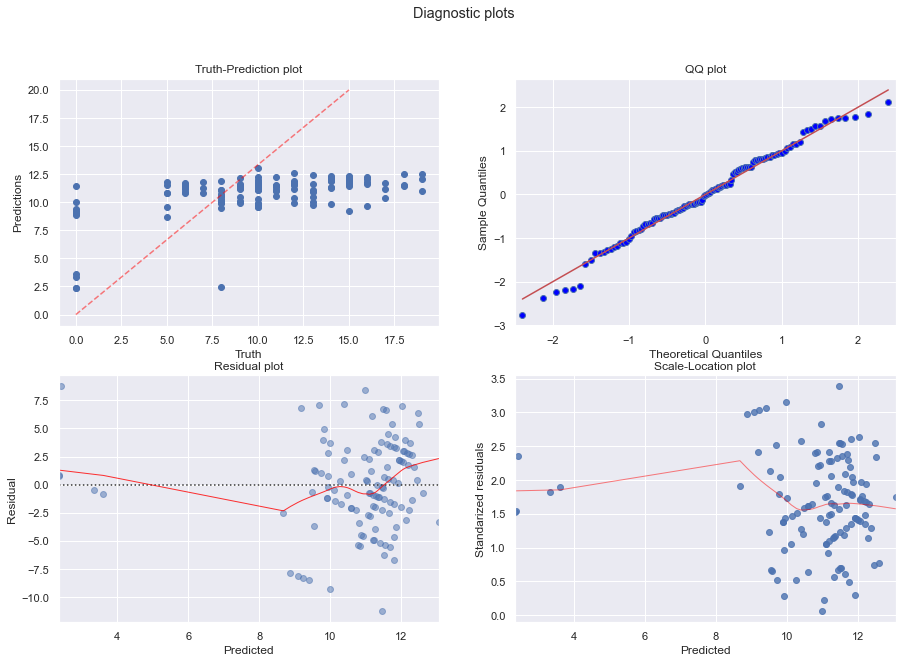

In [73]:
diagnostic_plot(y_test, rf_model_prediction)

In [74]:
# Import tools needed for visualization
from sklearn.tree import export_graphviz
import pydot

# Extract the small tree
tree_small = rf_model.best_estimator_.estimators_[5]
# Save the tree as a png image
export_graphviz(tree_small, out_file = 'small_tree.dot', feature_names = X_train.columns, rounded = True, precision = 1)

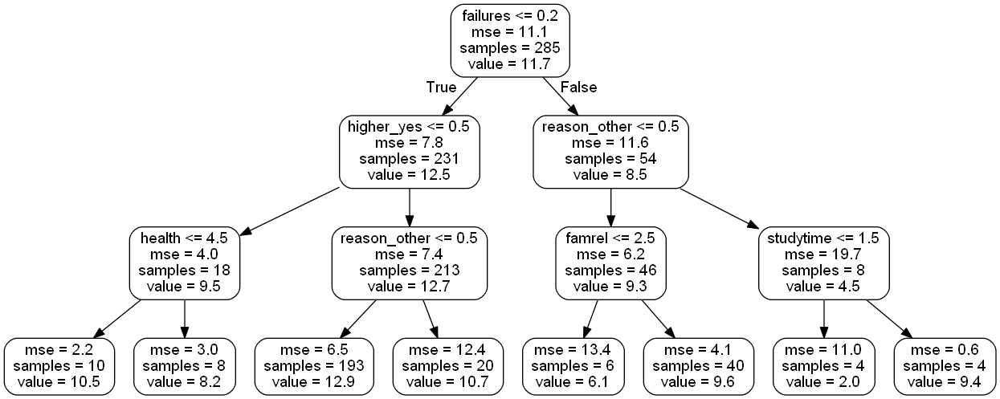

In [75]:
# dot -Tpng tree_small.dot -o tree_small.png
from IPython.display import Image
Image(filename = 'small_tree.png')

## Feature Importance of Random Forest Regressor

In [76]:
feat_df = pd.DataFrame({'Feature':X_train.columns, 'Importance':rf_model.best_estimator_.feature_importances_})
feat_df = feat_df.sort_values(by = 'Importance', ascending=False)
feat_df.head()

,Feature,Importance
12,absences,0.301021
5,failures,0.253139
8,goout,0.052692
11,health,0.044910
13,higher_yes,0.030365


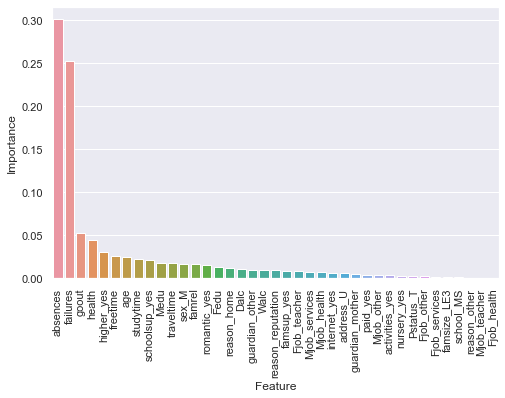

In [77]:
import seaborn as sns
g = sns.barplot(data=feat_df, x='Feature', y= 'Importance')
for item in g.get_xticklabels():
    item.set_rotation(90)

## Compare RMSE & R2 Score of all models

In [78]:
models_pred = [dummy_prediction, lm_prediction, lm_pf_prediction, lasso_prediction, ridge_prediction, elasticNet_prediction, lm_forward_prediction, lm_backwards_prediction, rf_model_prediction]
time_elapsed = [dummy_time, lm_time, lm_pf_time, lasso_time, ridge_time, EN_time, lm_forward_time, lm_backward_time, rf_time]
rmse_vals = []
for pred in models_pred:
    rmse_vals.append(rmse(y_test, pred))

R2_score = []
for pred in models_pred:
    R2_score.append(r2_score(y_test, pred))

labels = ['Dummy', 'Linear', 'Linear + PF', 'Ridge', 'Lasso', 'ElasticNet','Stepwise Forward','Stepwise Backward','Random Forest Regressor']

eval_df = pd.DataFrame({'RMSE':rmse_vals, 'R2 Score':R2_score, 'Time Elapsed':time_elapsed},index=labels)
eval_df

,RMSE,R2 Score,Time Elapsed
Dummy,4.688503,0.000000,0.002765
Linear,4.131824,0.223368,0.081724
Linear + PF,6.751757,-1.073792,0.898985
Ridge,4.246818,0.179537,0.073192
Lasso,4.138114,0.221002,1.933675
ElasticNet,4.246076,0.179824,0.502510
Stepwise Forward,4.295807,0.160499,2.283264
Stepwise Backward,4.192674,0.200325,0.526761
Random Forest Regressor,4.029179,0.261476,63.960419


Random Forest Regressor has the best RMSE value and R2 score of all models! Thus we would use the this model as our most optimal model for accuracy. However, random forest regressor takes a significantly longer time to train, thus would not be agile in deployment. <p><br />
The 3 regularized models come in 2nd in accuracy by a small margin of RMSE = 0.05. In terms of the training time, all 3 models scored significantly lower than the random forest regressor. The regularized models are well balanced models that performed well in RMSE and relatively low training time, which is practical in situations where frequent re-training of models is required

## Thank you for reviewing!